# Practical Machine Learning for Physicists

## Double Pendulum 

In this notebook you will be trying to predict a system using incomplete information. We will set up the equations of motions for a simple double pendulum (or should that be a double simple pendulum. Then we will see if a machine learning technique can predict the future position of the lower mass, using only the lower mass positions.

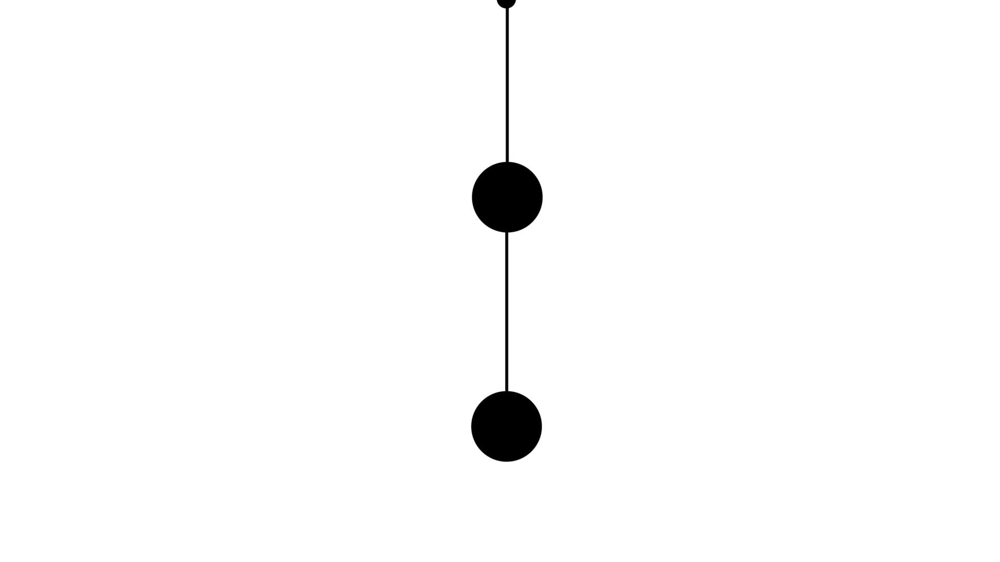

### Kinematics of the double pendulum
Let's specify our problem in terms of the following, with the origin at the pivot point of the top pendulum. This is just background for the machine learning tasks at the bottom of the notebook.

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$ 


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$ 
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where 
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [1]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import solve_ivp

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

import tensorflow as tf

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch

In [3]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2
    

In [4]:
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

z0=[np.pi/2,0,np.pi/2,0]
#z0=[0.1,0,0.1,0]
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [5]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


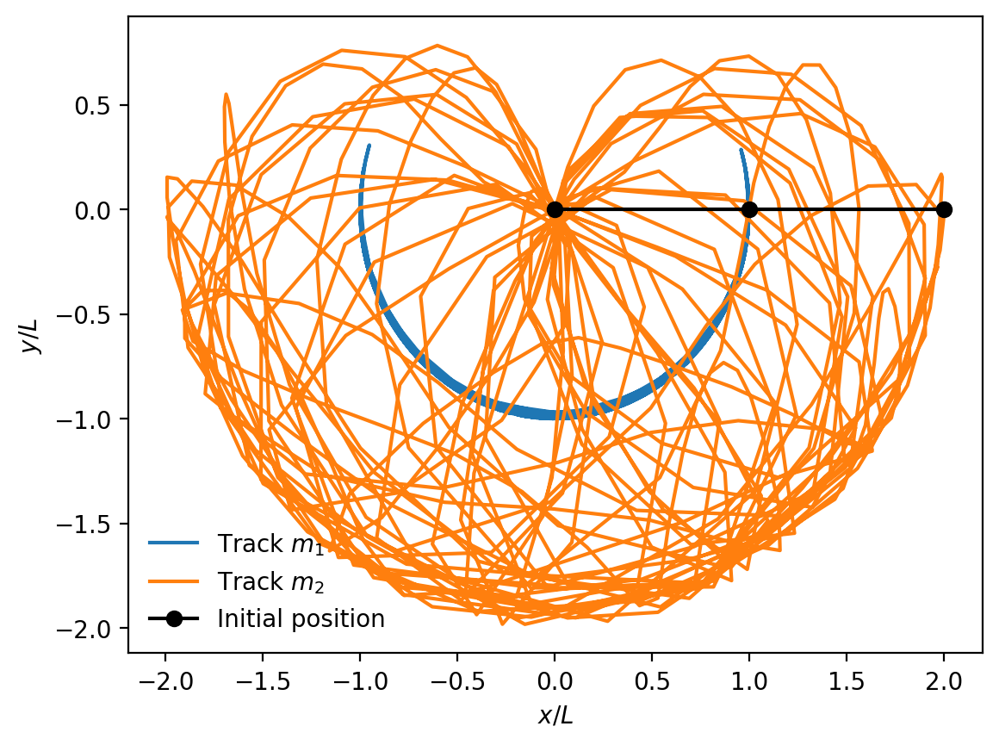

In [6]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Exercises: Predicting Chaos
1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 
2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp
3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)
4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.
5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)



# Task 1 : Designing and training a recurrent neural network to predict the future positions. 


#### <font color = blue > The future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$ </font>

In [7]:
# Defining new initial condition 
z0_new = [np.pi/4, 0, np.pi/4, 0]


# Solving motion of double pendulum for new initial conditions
ret_new = solve_ivp(rhs, (0, tmax), z0_new, t_eval=t, args=(L1, L2, m1, m2, g))


# Retrieving the calculated result for the motion of the double pendulum
z_new = ret_new.y


# Converting the state of pendulum from angular to Cartesian coordinates
positions = to_cartesian(*z_new, L1, L2)


# Extracting the Cartesian positions of the two masses
x1_new, y1_new, x2_new, y2_new = positions[:4]

In [8]:
# Setting up data to forecast the position of the pendulum after 20 steps
# We'll base our prediction on the following 20 swings of the pendulum


# Timesteps ahead for our prediction
timeframe = 20 


# Initialising two lists (X and Y) to store target positions (Y) and input sequences (X)
X, Y = [], []


# Looping through positions
# We will stop 'timeframe' steps before the end to avoid going out of bounds

for i in range(len(x1_new) - timeframe):
    
    # Stack the next 'timeframe' positions of both masses to serve as the input sequence
    X.append(np.vstack((x1_new[i:i+timeframe], y1_new[i:i+timeframe], x2_new[i:i+timeframe], y2_new[i:i+timeframe])).T)
    
    # Record the positions of both masses 20 steps ahead from the current timestep to set as the prediction target
    Y.append([x1_new[i+timeframe], y1_new[i+timeframe], x2_new[i+timeframe], y2_new[i+timeframe]])


# Converting position sequences to numpy array
X = np.array(X)

# Converting targets (positions 20 steps ahead) to numpy array
Y = np.array(Y)

In [9]:
from tensorflow.keras.models import Sequential # Importing the sequential model class
from tensorflow.keras.layers import LSTM, Dense # Importing LSTM and Dense layer classes


# ------ Defining an RNN (Recurrent Neural Network) model with LSTM (Long Short-Term Memory) layers --------

model = Sequential([
    
    LSTM(64, input_shape=(timeframe, 4), return_sequences=True),  # First LSTM layer with 64 units, returning sequences
    LSTM(32),  # Second LSTM layer with 32 units
    Dense(4)   # Output layer for future x1, y1, x2, y2 positions

])

# Compiling model with MSE loss function and Adam optimizer
model.compile(optimizer='adam', loss='mse')

In [10]:
# Training the model using input sequences to predict future positions, validating on 20% of the data
model.fit(X, Y, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
12/12 [==============================] - 2s 42ms/step - loss: 0.6322 - val_loss: 0.3089
Epoch 2/50
12/12 [==============================] - 0s 9ms/step - loss: 0.2482 - val_loss: 0.1100
Epoch 3/50
12/12 [==============================] - 0s 10ms/step - loss: 0.0675 - val_loss: 0.0408
Epoch 4/50
12/12 [==============================] - 0s 9ms/step - loss: 0.0328 - val_loss: 0.0286
Epoch 5/50
12/12 [==============================] - 0s 9ms/step - loss: 0.0237 - val_loss: 0.0214
Epoch 6/50
12/12 [==============================] - 0s 8ms/step - loss: 0.0181 - val_loss: 0.0164
Epoch 7/50
12/12 [==============================] - 0s 8ms/step - loss: 0.0154 - val_loss: 0.0157
Epoch 8/50
12/12 [==============================] - 0s 8ms/step - loss: 0.0140 - val_loss: 0.0146
Epoch 9/50
12/12 [==============================] - 0s 10ms/step - loss: 0.0135 - val_loss: 0.0137
Epoch 10/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0130 - val_loss: 0.0128
Epoch 11/50
12/1

## Task 2 : Testing the stability of the network to variations in initial conditions

#### <font color = blue > Making a plot of  𝑥  and  𝑦  vs time to show the network prediction in comparison to the solution from solve_ivp </font>

16/16 [==============================] - 0s 2ms/step


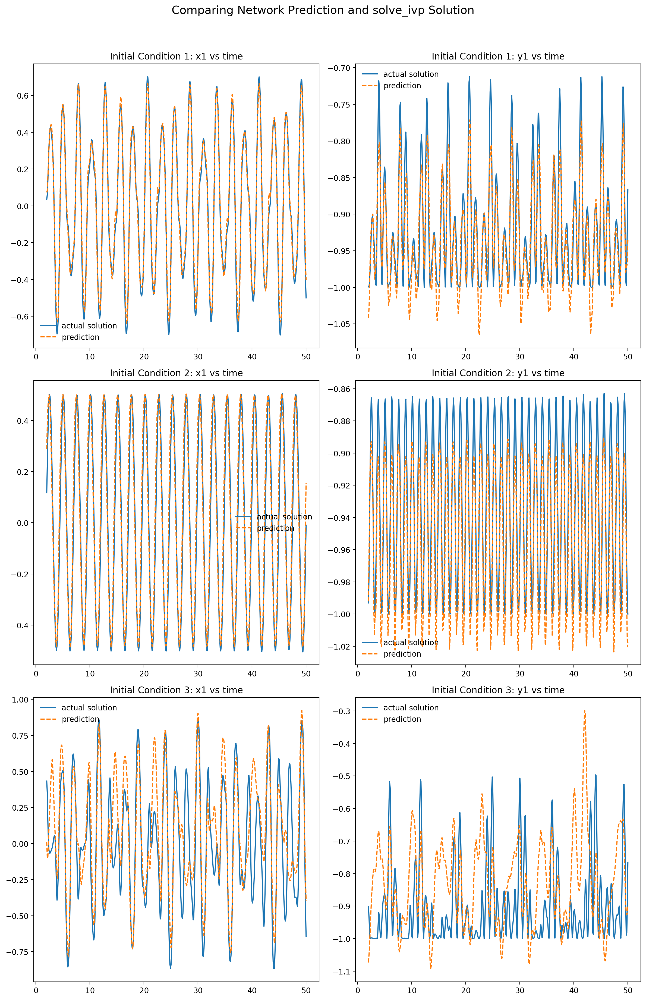

In [11]:
# Choosing a set of different initial conditions

initial_conditions = [
    [np.pi/4, 0, np.pi/4, 0],
    [np.pi/6, 0, np.pi/3, 0],
    [np.pi/3, 0, np.pi/6, 0]
]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions), 2, figsize=(12, 6*len(initial_conditions))) 

# Setting the main title for the figure
fig.suptitle('Comparing Network Prediction and solve_ivp Solution', y=1.02, fontsize=15)  

# Looping through each set of initial conditions
for i, z0_var in enumerate(initial_conditions):
    
    # Computing the trajectory / motion of the double pendulum for the specified initial conditions
    ret_var = solve_ivp(rhs, (0, tmax), z0_var, t_eval=t, args=(L1, L2, m1, m2, g))
    
    # Converting angular motion data to Cartesian coordinates
    positions_var = to_cartesian(*ret_var.y, L1, L2)
    
    # Extracting the cartesian coordinates of both pendulum masses for the simulated trajectory / motion
    x1_var, y1_var, x2_var, y2_var = positions_var[:4]

    # Preparing the data sequence for the network's prediction
    X_var = [np.vstack((x1_var[j:j+timeframe], y1_var[j:j+timeframe], x2_var[j:j+timeframe], y2_var[j:j+timeframe])).T for j in range(len(x1_var) - timeframe)]
    
    X_var = np.array(X_var)

    # Using the trained RNN model to predict the future positions 
    # (More simply we are generating predictions using the trained model)

    predictions = model.predict(X_var)

    
    ### ----- Plotting and comparing the simulated x1 position with its RNN prediction ------- 
    
    
    # Plotting the time evolution of x1 using the simulated solution
    axes[i, 0].plot(t[timeframe:], x1_var[timeframe:], label='actual solution')
    
    # Plotting the x1 predictions generated by the RNN model  (dashed line used to distinguish between solution & prediction plots)
    axes[i, 0].plot(t[timeframe:], predictions[:, 0], label='prediction', linestyle='dashed')
    
    # Setting the title
    axes[i, 0].set_title(f'Initial Condition {i+1}: x1 vs time')
    
    # Adding a legend to distinguish between simulated solution and prediction plots
    axes[i, 0].legend()

    
    ### -------- Plotting and comparing the simulated y1 position with its RNN prediction ---------- 
    
    
    # Plotting the time evolution of y1 using the simulated solution
    axes[i, 1].plot(t[timeframe:], y1_var[timeframe:], label='actual solution')
    
    # Plotting the y1 predictions generated by the RNN model (dashed line used to distinguish between solution & prediction plots)
    axes[i, 1].plot(t[timeframe:], predictions[:, 1], label='prediction', linestyle='dashed')
    
    # Setting the title
    axes[i, 1].set_title(f'Initial Condition {i+1}: y1 vs time')
    
    # Adding a legend to distinguish between simulated solution and prediction plots
    axes[i, 1].legend()

# Adjusting subplot layout for optimal display
plt.tight_layout()

plt.show()

## Task 3 : Probing how far into the future can a network predict 

#### <font color = blue> Making a plot to show how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from  $ t=t_0 + 20 \delta t $  to $ t=t_0 + 100 \delta t $  (e.g. for each extrapolation time, train a new version of the network and then plot the performance) </font>

1/1 [==============================] - 0s 319ms/step


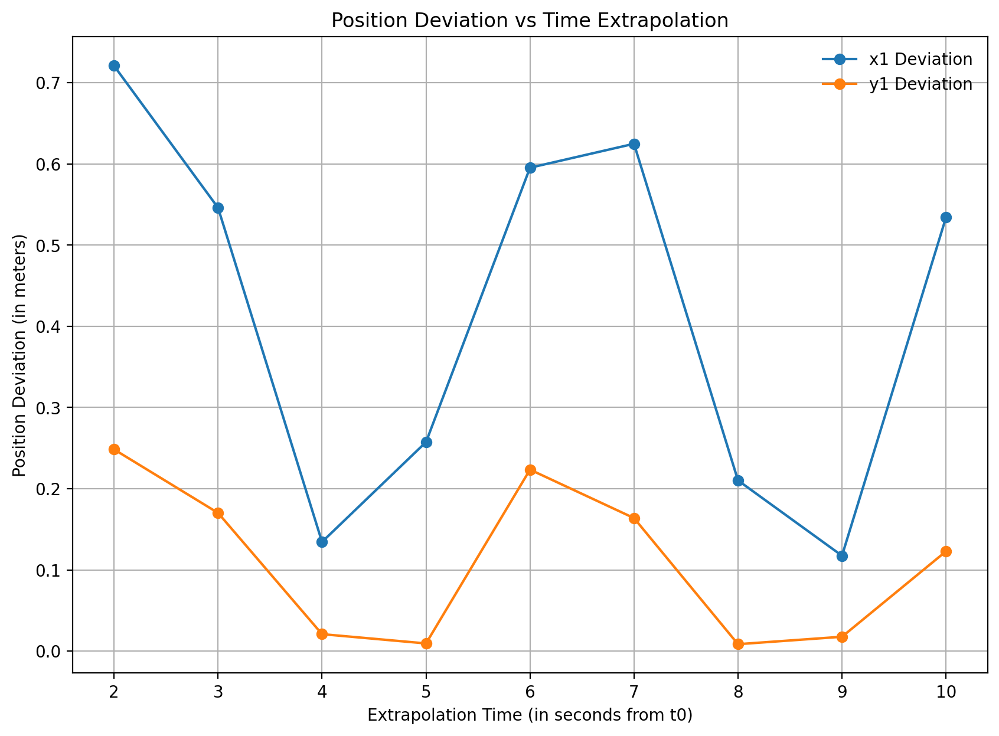

In [12]:
# Defining timesteps ahead for our prediction
timeframe = 20

# Calculating the size of the time step based on the assumption that the intervals are uniform
delta_t = t[1] - t[0] 

# Generating extrapolation time points starting at 20*delta_t and going up to 100*delta_t, separated by 10 delta_t intervals
extrapolation_times = np.arange(20, 101, 10) * delta_t

# Lists to store deviations between predicted and actual positions for x1 and y1 over different extrapolation times
x1_deviations = []
y1_deviations = []


# Iterating over the specified extrapolation times to assess prediction accuracy for each time point
for t_ext in extrapolation_times:
    
    # Getting the initial training timestamps and set the starting conditions for pendulum states   
    t_train = t[:timeframe]
    
    # Defining initial conditions: for both pendulums, angles set at pi/4 radians and angular velocities set at zero     
    z0_train = [np.pi/4, 0, np.pi/4, 0]
    
    # Simulating the double pendulum trajectory / motion up to the defined timeframe using the provided initial conditions
    ret_train = solve_ivp(rhs, (t[0], t[timeframe]), z0_train, t_eval=t_train, args=(L1, L2, m1, m2, g))
    
    # Converting the simulated angular positions to cartesian coordinates for both pendulums
    positions_train = to_cartesian(*ret_train.y, L1, L2)
    
    # Extracting the cartesian positions of the first pendulum for training
    x1_train, y1_train, _, _ = positions_train[:4]

    # Constructing the training input data matrix (input variables) from past pendulum positions; 
    # Each entry consists of paired x and y positions for all but the last timestep
    
    X_train = np.array([x1_train[:-1], y1_train[:-1]]).T.reshape(1, -1, 2)
    
    # Setting up the target data matrix (true outcomes) using the last timestep's positions.
    Y_train = np.array([x1_train[-1], y1_train[-1]]).reshape(1, -1)
    
    
    # Defining a sequential model to predict future positions using LSTM layers and a dense layer 

    model = Sequential([
    LSTM(64, input_shape=(19, 2), return_sequences=True),  # LSTM layer with 64 units, input sequence length of 19 and 2 features
    LSTM(32), # LSTM layer with 32 units
    Dense(2) # Output dense layer with 2 units for x1 and y1 predictions
    ])

    # Compiling the model using the Adam optimizer and mean squared error (MSE) loss function
    model.compile(optimizer='adam', loss='mse')
    
    # Training the model using the prepared training data for a specified number of epochs (50), with verbose set to 0 for silent training
    model.fit(X_train, Y_train, epochs=50, verbose=0)  # Training silently
    
    # Predicting position at t_ext using the trained model
    predicted_position_at_t_ext = model.predict(X_train)
    
    # Calculating the actual position at the extrapolation time t_ext using solve_ivp
    ret_ext = solve_ivp(rhs, (t[0], t[timeframe] + t_ext), z0_train, t_eval=[t[timeframe] + t_ext], args=(L1, L2, m1, m2, g))

    # Converting angular motion data of the extrapolated solution to Cartesian coordinates
    positions_ext = to_cartesian(*ret_ext.y, L1, L2)
    
    # Extracting the Cartesian positions of the first mass (x1 and y1) from the extrapolated solution
    x1_actual, y1_actual, _, _ = positions_ext[:4]
    
    # Calculate deviations between the predicted position at extrapolation time and the actual position
    x1_dev = abs(predicted_position_at_t_ext[0][0] - x1_actual[0])
    y1_dev = abs(predicted_position_at_t_ext[0][1] - y1_actual[0])

    # Store deviations values in the respective lists
    x1_deviations.append(x1_dev)
    y1_deviations.append(y1_dev)

               
        #####  ------ Plotting results --------
   
        
# Creating a figure to display the plot
plt.figure(figsize=(10, 7))

# Plotting the deviations of x1 as a function of extrapolation times
plt.plot(extrapolation_times, x1_deviations, label='x1 Deviation', marker='o')

# Plotting the deviations of y1 as a function of extrapolation times
plt.plot(extrapolation_times, y1_deviations, label='y1 Deviation', marker='o')

# x-axis label
plt.xlabel('Extrapolation Time (in seconds from t0)')

# y-axis label
plt.ylabel('Position Deviation (in meters)')

# Title of the plot
plt.title('Position Deviation vs Time Extrapolation')

# Displaying a legend for the plot
plt.legend()

# Add grid lines on the plot graph
plt.grid(True)

plt.show()

## Task 4 : Repeating steps 1-3 for the initial conditions $ 𝑧_0 = [𝜋/2,0,𝜋/2,0]$ which give a much more complex path

### 4.1: Designing and training a recurrent neural network to predict the future positions

In [13]:
# Import necessary modules
import numpy as np
from scipy.integrate import solve_ivp
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# ------- Initial Setup -------

# Defining the new initial condition to create a more complex pendulum path
z0_complex = [np.pi/2, 0, np.pi/2, 0]

# Solving the equations of motion for the double pendulum using these initial conditions
ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))

# Converting the angular positions and velocities to Cartesian coordinates
positions_complex = to_cartesian(*ret_complex.y, L1, L2)

# Spliting the results into separate Cartesian coordinates for both pendulums
x1_complex, y1_complex, x2_complex, y2_complex = positions_complex[:4]

# ------- Data Preparation -------

# Initializing lists to hold sequences of positions (X) and the target future positions (Y)
X_complex = []
Y_complex = []

# Preparing the input sequences and targets
# Looping through the positions, stopping 'timeframe' steps before the end to prevent out-of-bounds errors
for i in range(len(x1_complex) - timeframe):
    
    # Creating an input sequence of the next 'timeframe' positions for both pendulums
    input_sequence = np.vstack((x1_complex[i:i+timeframe], y1_complex[i:i+timeframe], x2_complex[i:i+timeframe], y2_complex[i:i+timeframe])).T
    X_complex.append(input_sequence)
    
    # Determining the target positions 20 steps ahead from the current time
    target_positions = [x1_complex[i+timeframe], y1_complex[i+timeframe], x2_complex[i+timeframe], y2_complex[i+timeframe]]
    Y_complex.append(target_positions)

# Converting the lists to numpy arrays for compatibility with Keras
X_complex = np.array(X_complex)
Y_complex = np.array(Y_complex)

# ------- Model Definition and Training -------

# Defining a recurrent neural network (RNN) model using LSTM layers
model_complex = Sequential([
    LSTM(64, input_shape=(timeframe, 4), return_sequences=True),  # Input shape corresponds to 'timeframe' timesteps and 4 position values (x1, y1, x2, y2)
    LSTM(32),
    Dense(4)  # Output layer has 4 units corresponding to future positions (x1, y1, x2, y2)
])

# Compiling the model with an optimizer and loss function suitable for regression tasks
model_complex.compile(optimizer='adam', loss='mse')

# Training the model using the prepared data, and set aside 20% of the data for validation
model_complex.fit(X_complex, Y_complex, epochs=50, batch_size=32, validation_split=0.2)


Epoch 1/50
12/12 [==============================] - 1s 33ms/step - loss: 0.6202 - val_loss: 0.5723
Epoch 2/50
12/12 [==============================] - 0s 9ms/step - loss: 0.4157 - val_loss: 0.3818
Epoch 3/50
12/12 [==============================] - 0s 7ms/step - loss: 0.3345 - val_loss: 0.3623
Epoch 4/50
12/12 [==============================] - 0s 7ms/step - loss: 0.2861 - val_loss: 0.3040
Epoch 5/50
12/12 [==============================] - 0s 7ms/step - loss: 0.2540 - val_loss: 0.2891
Epoch 6/50
12/12 [==============================] - 0s 7ms/step - loss: 0.2314 - val_loss: 0.2345
Epoch 7/50
12/12 [==============================] - 0s 9ms/step - loss: 0.2074 - val_loss: 0.2414
Epoch 8/50
12/12 [==============================] - 0s 9ms/step - loss: 0.1985 - val_loss: 0.2210
Epoch 9/50
12/12 [==============================] - 0s 9ms/step - loss: 0.1862 - val_loss: 0.1993
Epoch 10/50
12/12 [==============================] - 0s 10ms/step - loss: 0.1703 - val_loss: 0.1934
Epoch 11/50
12/12

### 4.2 : Testing the stability of the network to variations in initial conditions
#### <font color = blue> Making a plot of 𝑥 and 𝑦 vs time to show the network prediction in comparison to the solution from solve_ivp </font>

16/16 [==============================] - 0s 2ms/step


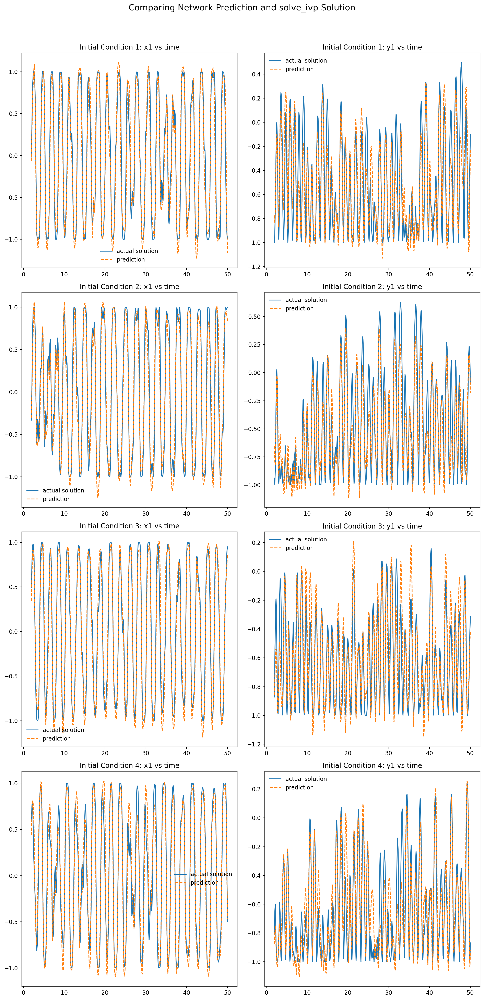

In [14]:
# Choosing a set of different initial conditions

initial_conditions = [
    
    [np.pi/2 + 0.1, 0.1, np.pi/2 + 0.1, 0.1],
    [np.pi/2 + 0.2, 0.2, np.pi/2 + 0.2, 0.2],
    [np.pi/2 - 0.1, -0.1, np.pi/2 - 0.1, -0.1],
    [np.pi/2 - 0.2, -0.2, np.pi/2 - 0.2, -0.2]
]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions), 2, figsize=(12, 6*len(initial_conditions))) 

# Setting the main title for the figure
fig.suptitle('Comparing Network Prediction and solve_ivp Solution', y=1.02, fontsize=15)  

# Looping through each set of initial conditions
for i, z0_complex in enumerate(initial_conditions):
    
    # Computing the trajectory / motion of the double pendulum for the specified initial conditions
    ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))
    
    # Converting angular motion data to Cartesian coordinates
    positions_complex = to_cartesian(*ret_complex.y, L1, L2)
    
    # Extracting the cartesian coordinates of both pendulum masses for the simulated trajectory / motion
    x1_complex, y1_complex, x2_complex, y2_complex = positions_complex[:4]

    # Preparing the data sequence for the network's prediction
    X_complex = [np.vstack((x1_complex[j:j+timeframe], y1_complex[j:j+timeframe], x2_complex[j:j+timeframe], y2_complex[j:j+timeframe])).T for j in range(len(x1_complex) - timeframe)]
    
    # Converting the list of position sequences into a numpy array for easier computation and model input compatibility
    X_complex = np.array(X_complex)


    # Using the trained RNN model to predict the future positions 
    # (More simply we are generating predictions using the trained model)
    predictions = model_complex.predict(X_complex)

    
    ### ------- Plotting and comparing the simulated x1 position with its RNN prediction -------- 
    
    
    # Plotting the time evolution of x1 using the simulated solution
    axes[i, 0].plot(t[timeframe:], x1_complex[timeframe:], label='actual solution')
    
    # Plotting the x1 predictions generated by the RNN model  (dashed line used to distinguish between solution & prediction plots)
    axes[i, 0].plot(t[timeframe:], predictions[:, 0], label='prediction', linestyle='dashed')
    
    # Setting the title
    axes[i, 0].set_title(f'Initial Condition {i+1}: x1 vs time')
    
    # Adding a legend to distinguish between simulated solution and prediction plots
    axes[i, 0].legend()

    
    ### ----- Plotting and comparing the simulated y1 position with its RNN prediction --------
    
    # Plotting the time evolution of y1 using the simulated solution
    axes[i, 1].plot(t[timeframe:], y1_complex[timeframe:], label='actual solution')
    
    # Plotting the y1 predictions generated by the RNN model (dashed line used to distinguish between solution & prediction plots)
    axes[i, 1].plot(t[timeframe:], predictions[:, 1], label='prediction', linestyle='dashed')
    
    # Setting the title
    axes[i, 1].set_title(f'Initial Condition {i+1}: y1 vs time')
    
    # Adding a legend to distinguish between simulated solution and prediction plots
    axes[i, 1].legend()

# Adjusting subplot layout for optimal display
plt.tight_layout()

plt.show()

### 4.3 : Probing how far into the future our network can predict 

#### <font color = blue> Making a plot to show how the deviation between predicted position and actual position </font>


13/13 [==============================] - 0s 8ms/step


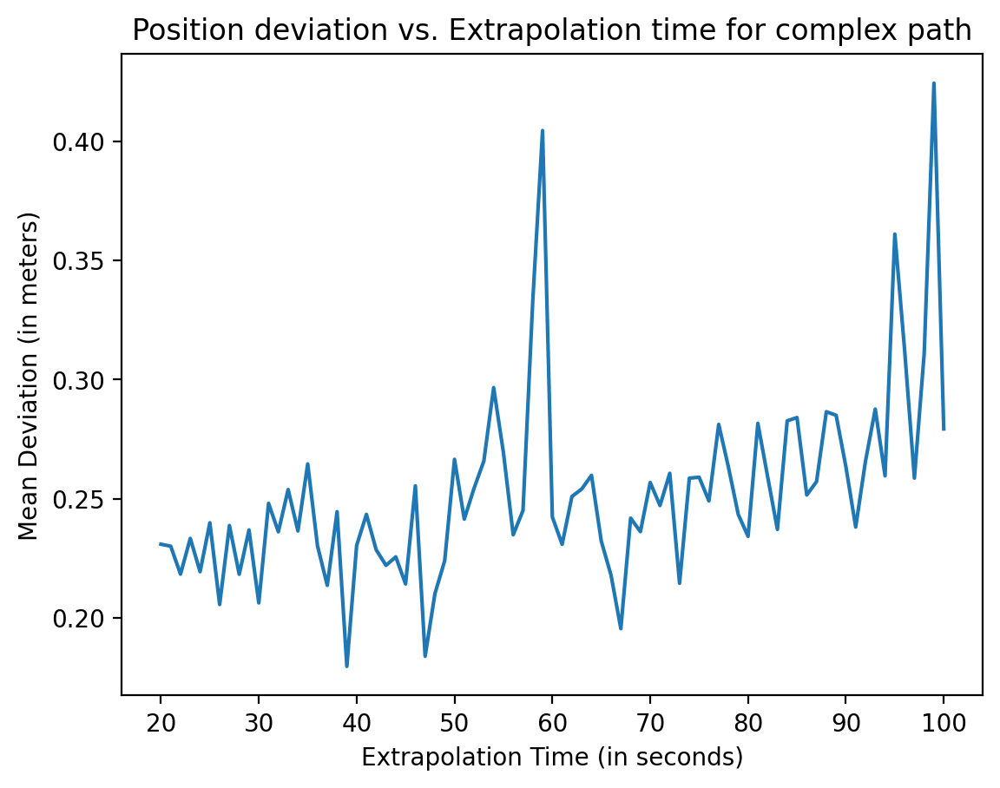

In [15]:
# Define the complex initial condition for the pendulum
z0_complex = [np.pi/2, 0, np.pi/2, 0]

# Obtaining the motion trajectory using the above initial condition
ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))

# Converting angular coordinates to Cartesian coordinates for the double pendulum's motion
positions_complex = to_cartesian(*ret_complex.y, L1, L2)

# Extracting x and y positions for the two masses
x1_complex, y1_complex, x2_complex, y2_complex = positions_complex[:4]

# Defining a List to store mean postion deviations for different extrapolation times
deviations = []

# Looping over extrapolation times, from 20 steps ahead to 100 steps ahead
for delta in range(20, 101):
    
    # Creating datasets for this extrapolation time
    X_complex, Y_complex = [], []
    
    for i in range(len(x1_complex) - delta):
        
        # Getting sequences of positions as input
        X_complex.append(np.vstack((x1_complex[i:i+delta], y1_complex[i:i+delta], x2_complex[i:i+delta], y2_complex[i:i+delta])).T)
        
        # Target is the position delta steps ahead
        Y_complex.append([x1_complex[i+delta], y1_complex[i+delta], x2_complex[i+delta], y2_complex[i+delta]])

    # Converting lists to numpy arrays for model training
    X_complex = np.array(X_complex)
    Y_complex = np.array(Y_complex)

    # Defining the RNN model
    model_complex = Sequential([
        LSTM(64, input_shape=(delta, 4), return_sequences=True),  # First LSTM layer with sequence input
        LSTM(32),  # Further LSTM layer to refine model's understanding
        Dense(4)   # Output layer predicting positions of the two masses
    ])
    
    # Compiling the model with an optimizer and loss function suitable for regression tasks
    model_complex.compile(optimizer='adam', loss='mse')

    # Training the model (silent mode with verbose=0)
    model_complex.fit(X_complex, Y_complex, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Using trained model to predict positions
    predictions = model_complex.predict(X_complex)

    # Working out the average difference between the estimates and actual positions for this extrapolation time
    deviation = np.mean(np.sqrt(np.sum(np.square(predictions - Y_complex), axis=1)))
    
    # Adding the computed position deviation for this extrapolation time to the list
    deviations.append(deviation)

# Visualizing how deviations change with extrapolation time
plt.plot(range(20, 101), deviations)

# x-axis label
plt.xlabel("Extrapolation Time (in seconds)")

# y-axis label
plt.ylabel("Mean Deviation (in meters)")

# Title of plot
plt.title("Position deviation vs. Extrapolation time for complex path")


plt.show()

### Task 5 : Repeating steps 1-4 but only training the neural network on the cartesian coordinates of the mass $𝑚_2$  (i.e without showing your neural network the positions of the mass  $𝑚_1$ )

In [16]:
##### ----- Generating data for m2 with the initial conditions -----

# Defining the initial conditions
z0 = [np.pi/4, 0, np.pi/2, 0]

# Solving for motion of the double pendulum
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))

# Converting the state of pendulum from angular to Cartesian coordinates
positions = to_cartesian(*ret.y, L1, L2)

# Extracting the Cartesian positions of only the mass m2
x2, y2 = positions[2], positions[3]

In [17]:
#### –––– Preparing sequences for training –––––– 

# Initializing lists to store input sequences and targets
X, Y = [], []

# Generating input sequences and targets for training
for i in range(len(x2) - timeframe):
    # Stacking positions of mass m2 to serve as input sequence
    X.append(np.vstack((x2[i:i+timeframe], y2[i:i+timeframe])).T)
    
    # Add the position of m2 that is 'timeframe' steps in the future to the target list 'Y'
    Y.append([x2[i+timeframe], y2[i+timeframe]])

# Converting lists to numpy arrays for training
X = np.array(X)
Y = np.array(Y)

In [18]:
#### –––– Defining and training the model –––––– 

# Defining the RNN model focused on m2
model_m2 = Sequential([
    LSTM(64, input_shape=(timeframe, 2), return_sequences=True),  # First (LSTM) layer with 64 units
    LSTM(32), # Second (LSTM) layer with 32 units
    Dense(2) # Output layer with 2 units for x and y predictions
])

# Compiling the model
model_m2.compile(optimizer='adam', loss='mse')

# Training the model
model_m2.fit(X, Y, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
12/12 [==============================] - 1s 34ms/step - loss: 1.1811 - val_loss: 0.7205
Epoch 2/50
12/12 [==============================] - 0s 7ms/step - loss: 0.3458 - val_loss: 0.1208
Epoch 3/50
12/12 [==============================] - 0s 7ms/step - loss: 0.1129 - val_loss: 0.0832
Epoch 4/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0391 - val_loss: 0.0198
Epoch 5/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0102 - val_loss: 0.0080
Epoch 6/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0045 - val_loss: 0.0036
Epoch 7/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 8/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0015 - val_loss: 0.0029
Epoch 9/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 10/50
12/12 [==============================] - 0s 7ms/step - loss: 0.0011 - val_loss: 0.0019
Epoch 11/50
12/12 

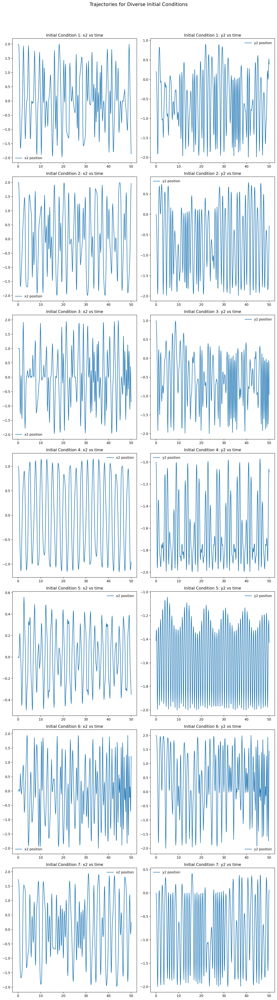

In [22]:
#### –––– Testing the stability of the network to variations in initial conditions –––––– 

# Defining different initial conditions

initial_conditions = [
    
      [np.pi/2 + 0.1, 0.1, np.pi/2 + 0.1, 0.1],
    [np.pi/2, 0, np.pi/2, 0],
    [np.pi/2, 0, np.pi, 0],
    [0, 0, np.pi/2, 0],
    [np.pi/4, 1, -np.pi/4, -1],
    [np.pi, 1, np.pi, -1],
    [np.pi/3, 0, 2*np.pi/3, 0]

]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions), 2, figsize=(12, 6*len(initial_conditions))) 

# Setting the main title for the figure
fig.suptitle('Trajectories for Diverse Initial Conditions', y=1.02, fontsize=15)  

# Looping through each set of initial conditions
for i, z0_complex in enumerate(initial_conditions):
    
    # Computing the trajectory / motion of the double pendulum for the specified initial conditions
    ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))
    
    # Converting angular motion data to Cartesian coordinates
    positions_complex = to_cartesian(*ret_complex.y, L1, L2)
    
    # Extracting the cartesian coordinates of only the second pendulum mass for the simulated trajectory / motion
    x2_complex, y2_complex = positions_complex[2:4]

    # Plotting the x2 coordinate
    axes[i, 0].plot(t, x2_complex, label='x2 position')
    axes[i, 0].set_title(f'Initial Condition {i+1}: x2 vs time')
    axes[i, 0].legend()
    
    # Plotting the y2 coordinate
    axes[i, 1].plot(t, y2_complex, label='y2 position')
    axes[i, 1].set_title(f'Initial Condition {i+1}: y2 vs time')
    axes[i, 1].legend()

# Adjusting subplot layout for optimal display
plt.tight_layout()

plt.show()

In [24]:
# ------------------------------------------------------------------------------
# ------- Exploring The Predictive Scope of the Network  -----------------------
# ------------------------------------------------------------------------------


# In the following section, we'll try to figure out how well our 
# neural network can predict things over various lengths of time 

# In particular:

# - For each extrapolation time, we will train various versions of the network

# - For each trained version, we will compare its results with the real positions that we get from 'solve_ivp'

# - Over a range of extrapolation times from t=t0+20t to t=t0+100t, 
#  the difference (deviation) between the predicted and real positions will be plotted

# ------------------------------------------------------------------------------
# This is important as it will help us figure out how accurate 
# the network's predictions are as we move further into the future
# ------------------------------------------------------------------------------

In [25]:
# Defining a longer time duration
long_tmax = tmax * 5  # Five times longer than the original

# Generating an array of evenly spaced time points from 0 to `long_tmax` 
# using a step size of `dt`. The number of points is calculated by 
# dividing `long_tmax` by `dt`.
long_t = np.linspace(0, long_tmax, int(long_tmax/dt))

# Simulating the double pendulum trajectory / motion for the extended duration
ret_long = solve_ivp(rhs, (0, long_tmax), z0, t_eval=long_t, args=(L1, L2, m1, m2, g))

# Converting angular coordinates from `ret_long.y` to Cartesian for the double pendulum
positions_long = to_cartesian(*ret_long.y, L1, L2)

# Extracting the Cartesian coordinates for the second mass from the long-duration simulation
x2_long, y2_long = positions_long[2], positions_long[3]

# ---------------------------------------
# Training Models for various 'Look-Ahead' Times
# ---------------------------------------
# For each look-ahead time (from 20 to 100 time steps), we:
# 1. Prepare the data
# 2. Train a model
# 3. Calculate the mean deviation of its predictions

# Store the mean deviation for each look-ahead time
deviations = []

# Loop through the different look-ahead times
for delta in range(20, 101):
    
    # Prepare input sequences and target data
    X, Y = [], []
    
    #  Iterating through the 'x2_long' data length, pausing 'delta' steps before the end
    for i in range(len(x2_long) - delta):
        
        # Create sequences of x2 and y2 positions for the current timeframe
        X.append(np.vstack((x2_long[i:i+delta], y2_long[i:i+delta])).T)
        
        # Target is the position of m2 at the end of the current sequence + delta
        Y.append([x2_long[i+delta], y2_long[i+delta]])

    # Converting the input sequences and target values from lists to numpy arrays for training
    X = np.array(X)
    Y = np.array(Y)
    
    # Defining a neural network model to predict positions based on the current time frame (delta)
    
    model = Sequential([
        LSTM(64, input_shape=(delta, 2), return_sequences=True), # First (LSTM) layer with 64 memory units
        LSTM(32), # Second (LSTM) layer with 32 units
        Dense(2) # Output layer with 2 units for x and y predictions
    ])
    
    # Compiling and training the model
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, Y, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Predicting using the trained model and calculate deviation from the true values
    predictions = model.predict(X)
    
    # Calculating the average difference between our predicted and actual positions.
    deviation = np.mean(np.sqrt(np.sum(np.square(predictions - Y), axis=1)))
    
    # Storing the deviation for the current look-ahead time
    deviations.append(deviation)

# -------------------------------
# Plotting the Look-Ahead Deviations
# -------------------------------
# This will demonstrate how the prediction's accuracy changes when the future is projected further out

# Creating a new figure with dimensions 12x6
plt.figure(figsize=(12, 6))

# Plotting the mean deviation values against the range of extrapolation times from 20 to 100
plt.plot(range(20, 101), deviations)

# x-axis label
plt.xlabel("Look-Ahead Time (in time steps) / seconds")

# y-axis label
plt.ylabel("Mean Deviation from Real Value / metres ")

# Title of plot
plt.title("Prediction Accuracy with Increasing Look-Ahead Time")

plt.grid(True)

plt.show()

76/76 [==============================] - 1s 6ms/step


KeyboardInterrupt: 